In [1]:
from pycaret.utils import version
version()

'3.0.0.rc8'

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

Importing Stock Dataset

In [3]:
stocks = pd.read_csv("https://raw.githubusercontent.com/PJalgotrader/Deep_forecasting-USU/main/data/yfinance.csv", index_col=0, header=[0,1])
stocks.head()

Adj Close                                                 \
                 AAPL         GLD       MSFT         QQQ         SPY   
Date                                                                   
2018-01-02  40.950497  125.150002  80.940392  153.123489  246.766678   
2018-01-03  40.943367  124.820000  81.317093  154.611298  248.327499   
2018-01-04  41.133541  125.459999  82.032768  154.881836  249.374115   
2018-01-05  41.601864  125.330002  83.049835  156.437332  251.035934   
2018-01-08  41.447350  125.309998  83.134598  157.045990  251.495041   

                                      Close                         ...  \
                 TSLA        USO       AAPL         GLD       MSFT  ...   
Date                                                                ...   
2018-01-02  21.368668  96.559998  43.064999  125.150002  85.949997  ...   
2018-01-03  21.150000  98.720001  43.057499  124.820000  86.349998  ...   
2018-01-04  20.974667  98.959999  43.257500  125.459999  87.110001  ...   
2018-01-05  21.105333  98.480003  43.750000  125.330002  88.190002  ...   
2018-01-08  22.427334  99.040001  43.587502  125.309998  88.279999  ...   

                  Open                           Volume                      \
                   SPY       TSLA        USO       AAPL       GLD      MSFT   
Date                                                                          
2018-01-02  267.839996  20.799999  96.559998  102223600  11762500  22483800   
2018-01-03  268.959991  21.400000  97.360001  118071600   7904300  26061400   
2018-01-04  271.200012  20.858000  98.639999   89738400   7329700  21912000   
2018-01-05  272.510010  21.108000  98.239998   94640000   5739900  23407100   
2018-01-08  273.309998  21.066668  98.480003   82271200   3566700  22113000   

                                                    
                 QQQ       SPY       TSLA      USO  
Date                                                
2018-01-02  32573300  86655700   65283000  1497588  
2018-01-03  29383600  90070400   67822500  2156150  
2018-01-04  24776100  80636400  149194500  1480988  
2018-01-05  26992300  83524000   68868000  1609888  
2018-01-08  23159100  57319200  147891000  1229225  

[5 rows x 42 columns]

In [4]:
# if you are working with Pandas, your first job should be changing the type of the index to datetime and then to period! This is a compatibility issue with other packages.
stocks.index

Index(['2018-01-02', '2018-01-03', '2018-01-04', '2018-01-05', '2018-01-08',
       '2018-01-09', '2018-01-10', '2018-01-11', '2018-01-12', '2018-01-16',
       ...
       '2022-12-16', '2022-12-19', '2022-12-20', '2022-12-21', '2022-12-22',
       '2022-12-23', '2022-12-27', '2022-12-28', '2022-12-29', '2022-12-30'],
      dtype='object', name='Date', length=1259)

In [5]:
stocks.index = pd.to_datetime(stocks.index).to_period('B')
stocks.index

PeriodIndex(['2018-01-02', '2018-01-03', '2018-01-04', '2018-01-05',
             '2018-01-08', '2018-01-09', '2018-01-10', '2018-01-11',
             '2018-01-12', '2018-01-16',
             ...
             '2022-12-16', '2022-12-19', '2022-12-20', '2022-12-21',
             '2022-12-22', '2022-12-23', '2022-12-27', '2022-12-28',
             '2022-12-29', '2022-12-30'],
            dtype='period[B]', name='Date', length=1259)

In [6]:
df = stocks['Close'][['AAPL']]
df.head()

,AAPL
Date,
2018-01-02,43.064999
2018-01-03,43.057499
2018-01-04,43.257500
2018-01-05,43.750000
2018-01-08,43.587502


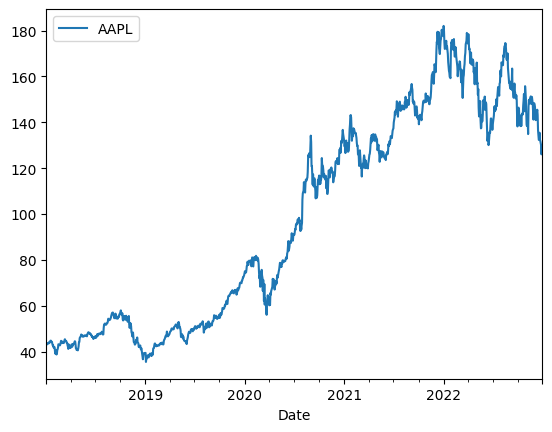

In [7]:
df.plot()
plt.show()

In [8]:
df.index

PeriodIndex(['2018-01-02', '2018-01-03', '2018-01-04', '2018-01-05',
             '2018-01-08', '2018-01-09', '2018-01-10', '2018-01-11',
             '2018-01-12', '2018-01-16',
             ...
             '2022-12-16', '2022-12-19', '2022-12-20', '2022-12-21',
             '2022-12-22', '2022-12-23', '2022-12-27', '2022-12-28',
             '2022-12-29', '2022-12-30'],
            dtype='period[B]', name='Date', length=1259)

In [9]:
idx = pd.period_range(min(df.index), max(df.index))
idx

PeriodIndex(['2018-01-02', '2018-01-03', '2018-01-04', '2018-01-05',
             '2018-01-08', '2018-01-09', '2018-01-10', '2018-01-11',
             '2018-01-12', '2018-01-15',
             ...
             '2022-12-19', '2022-12-20', '2022-12-21', '2022-12-22',
             '2022-12-23', '2022-12-26', '2022-12-27', '2022-12-28',
             '2022-12-29', '2022-12-30'],
            dtype='period[B]', length=1304)

In [10]:
df.index.symmetric_difference(idx)

PeriodIndex(['2018-01-15', '2018-02-19', '2018-03-30', '2018-05-28',
             '2018-07-04', '2018-09-03', '2018-11-22', '2018-12-05',
             '2018-12-25', '2019-01-01', '2019-01-21', '2019-02-18',
             '2019-04-19', '2019-05-27', '2019-07-04', '2019-09-02',
             '2019-11-28', '2019-12-25', '2020-01-01', '2020-01-20',
             '2020-02-17', '2020-04-10', '2020-05-25', '2020-07-03',
             '2020-09-07', '2020-11-26', '2020-12-25', '2021-01-01',
             '2021-01-18', '2021-02-15', '2021-04-02', '2021-05-31',
             '2021-07-05', '2021-09-06', '2021-11-25', '2021-12-24',
             '2022-01-17', '2022-02-21', '2022-04-15', '2022-05-30',
             '2022-06-20', '2022-07-04', '2022-09-05', '2022-11-24',
             '2022-12-26'],
            dtype='period[B]')

In [11]:
df = df.reindex(idx, fill_value=np.nan)
df.tail()

,AAPL
2022-12-26,NaN
2022-12-27,130.029999
2022-12-28,126.040001
2022-12-29,129.610001
2022-12-30,129.929993


In [12]:
df = df.fillna(method = 'ffill')
df.tail(10)

,AAPL
2022-12-19,132.369995
2022-12-20,132.300003
2022-12-21,135.449997
2022-12-22,132.229996
2022-12-23,131.860001
2022-12-26,131.860001
2022-12-27,130.029999
2022-12-28,126.040001
2022-12-29,129.610001
2022-12-30,129.929993


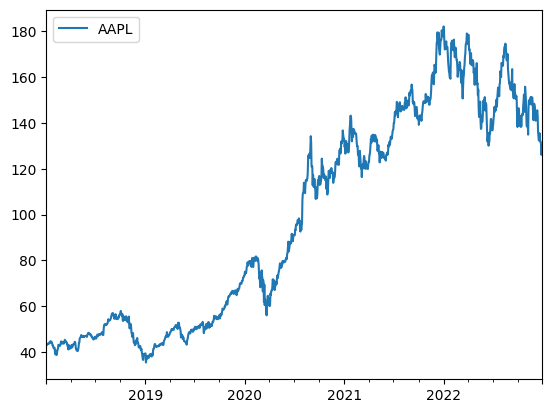

In [13]:
df.plot()
plt.show()

# Time series Cross validation with PyCaret

In [14]:
from pycaret.time_series import *

In [15]:
from sktime.forecasting.model_selection import SlidingWindowSplitter
# https://www.sktime.org/en/stable/api_reference/auto_generated/sktime.forecasting.model_selection.SlidingWindowSplitter.html

In [16]:
import numpy as np
from sktime.forecasting.model_selection import SlidingWindowSplitter
ts = np.arange(10)
splitter = SlidingWindowSplitter(fh=np.arange(1,3), window_length=3, step_length=1)
list(splitter.split(ts)) 

[(array([0, 1, 2], dtype=int64), array([3, 4], dtype=int64)),
 (array([1, 2, 3], dtype=int64), array([4, 5], dtype=int64)),
 (array([2, 3, 4], dtype=int64), array([5, 6], dtype=int64)),
 (array([3, 4, 5], dtype=int64), array([6, 7], dtype=int64)),
 (array([4, 5, 6], dtype=int64), array([7, 8], dtype=int64)),
 (array([5, 6, 7], dtype=int64), array([8, 9], dtype=int64))]

In [17]:
df.size

1304

In [18]:
exp = TSForecastingExperiment()
exp.setup(data = df, target='AAPL' ,coverage=0.90, fold_strategy=SlidingWindowSplitter(fh=np.arange(1,23), window_length=130, step_length=130)) # using the past 6 months data to make prediction for the next month and moving half a year forward. 

,Description,Value
0,session_id,2352
1,Target,AAPL
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1304, 1)"
5,Transformed data shape,"(1304, 1)"
6,Transformed train set shape,"(1282, 1)"
7,Transformed test set shape,"(22, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,SlidingWindowSplitter


I am not sure why, but PyCaret timeseries setup does not support sklearn cross validation strategies like "TimeSeriesSplit". This is available with the PyCaret regression and classification though!!!

I was expecting the following code running in Pycaret but it doesn't. 

In [19]:
from sklearn.model_selection import TimeSeriesSplit
# exp2 = TSForecastingExperiment()
#exp2.setup(data = df, target='AAPL' , coverage=0.90, fold_strategy=TimeSeriesSplit(n_splits=5, max_train_size=250, gap=20, test_size=60)) 

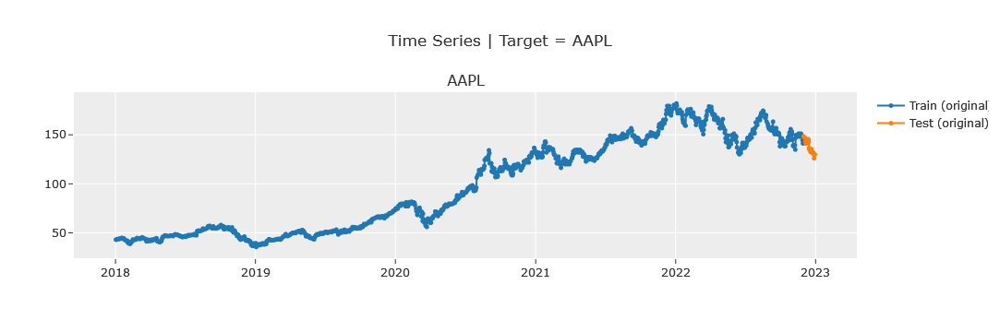

In [20]:
exp.plot_model(plot='train_test_split')

In [21]:
exp1=TSForecastingExperiment()
exp1.setup(data=df,target='AAPL',fh=22,coverage=0.90,fold_strategy='sliding',fold=10)

,Description,Value
0,session_id,3180
1,Target,AAPL
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(1304, 1)"
5,Transformed data shape,"(1304, 1)"
6,Transformed train set shape,"(1282, 1)"
7,Transformed test set shape,"(22, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,SlidingWindowSplitter


In [22]:
#exp1.plot_model(plot='cv')

Let's see which one is the best model?

In [23]:
exp.compare_models(sort='rmse')

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
naive,Naive Forecaster,1.1370,1.0628,4.7073,5.4319,0.0420,0.0425,-2.1772,9.5078
huber_cds_dt,Huber w/ Cond. Deseasonalize & Detrending,1.0961,1.0234,4.8305,5.5634,0.0413,0.0422,-2.6182,0.9456
theta,Theta Forecaster,1.1267,1.0516,4.9414,5.7165,0.0421,0.0426,-2.1398,0.1078
arima,ARIMA,1.0909,1.0533,4.8717,5.8526,0.0424,0.0429,-2.1673,0.2667
auto_arima,Auto ARIMA,1.2432,1.1550,5.3659,6.1774,0.0479,0.0486,-3.2949,4.8611
omp_cds_dt,Orthogonal Matching Pursuit w/ Cond. Deseasonalize & Detrending,1.2727,1.1702,5.4489,6.2364,0.0483,0.0494,-3.6038,0.8778
ets,ETS,1.1655,1.0980,5.3418,6.2578,0.0451,0.0455,-2.5435,0.3089
exp_smooth,Exponential Smoothing,1.1698,1.1025,5.3375,6.2624,0.0456,0.0460,-2.4926,0.3089
lar_cds_dt,Least Angular Regressor w/ Cond. Deseasonalize & Detrending,1.2721,1.1737,5.4906,6.2938,0.0482,0.0493,-3.5805,1.0222
br_cds_dt,Bayesian Ridge w/ Cond. Deseasonalize & Detrending,1.2989,1.1916,5.5262,6.3181,0.0498,0.0508,-3.8175,1.0867


NaiveForecaster()

Bootstrapping with PyCaret?

    curious to see how to bootstrapping is handled with PyCaret? search for the random forest model (rf_cds_dt) source code in Pycaret Github for example.

    As you may see here (https://github.com/pycaret/pycaret/blob/676cdb963877f98496a57bc77317356a09e10d70/pycaret/containers/models/time_series.py ), the bootstrap is on and off and that's it. No special consideration for moving block bootstrap or circular block or stationary bootstrap.

    You can do it from scratch here: https://arch.readthedocs.io/en/latest/bootstrap/timeseries-bootstraps.html


In [24]:
my_models = ['naive','ets', 'arima', 'rf_cds_dt', 'knn_cds_dt', 'xgboost_cds_dt', 'lightgbm_cds_dt', 'catboost_cds_dt' , 'gbr_cds_dt']
exp.compare_models(include=my_models, sort='rmse')

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
naive,Naive Forecaster,1.1370,1.0628,4.7073,5.4319,0.0420,0.0425,-2.1772,0.0733
arima,ARIMA,1.0909,1.0533,4.8717,5.8526,0.0424,0.0429,-2.1673,0.1544
ets,ETS,1.1655,1.0980,5.3418,6.2578,0.0451,0.0455,-2.5435,0.3033
rf_cds_dt,Random Forest w/ Cond. Deseasonalize & Detrending,1.2001,1.1187,5.5555,6.4371,0.0463,0.0469,-2.8246,1.4889
lightgbm_cds_dt,Light Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.3081,1.2367,5.9438,6.9165,0.0523,0.0531,-4.0093,0.8767
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.4037,1.3114,6.2237,7.1975,0.0534,0.0542,-4.0045,0.8422
xgboost_cds_dt,Extreme Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.4810,1.3683,6.6123,7.5758,0.0575,0.0584,-4.6771,1.0622
knn_cds_dt,K Neighbors w/ Cond. Deseasonalize & Detrending,1.4416,1.3388,6.6735,7.6931,0.0556,0.0567,-4.8106,1.1867
catboost_cds_dt,CatBoost Regressor w/ Cond. Deseasonalize & Detrending,1.5057,1.4102,6.6628,7.7312,0.0570,0.0583,-5.2219,3.3589


NaiveForecaster()

Let's tuned these models!

In [32]:
ets = exp.create_model('ets')

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2018-07-02'], dtype='period[B]')",0.5309,0.4968,0.9735,1.1630,0.0202,0.0205,-0.6327
1,"PeriodIndex(['2018-12-31'], dtype='period[B]')",0.8614,0.8557,2.0331,2.5204,0.0524,0.0541,-4.1037
2,"PeriodIndex(['2019-07-01'], dtype='period[B]')",0.2040,0.2074,0.4215,0.5222,0.0082,0.0082,0.5517
3,"PeriodIndex(['2019-12-30'], dtype='period[B]')",1.4792,1.3740,2.9051,3.2277,0.0370,0.0379,-1.0031
4,"PeriodIndex(['2020-06-29'], dtype='period[B]')",0.4823,0.4529,2.0256,2.4002,0.0213,0.0213,-0.0916
5,"PeriodIndex(['2020-12-28'], dtype='period[B]')",1.0725,1.0247,7.2976,8.5240,0.0561,0.0541,-1.8940
6,"PeriodIndex(['2021-06-28'], dtype='period[B]')",2.3783,2.0569,11.4138,12.2425,0.0785,0.0821,-9.3478
7,"PeriodIndex(['2021-12-27'], dtype='period[B]')",2.4110,2.3103,11.7887,14.6033,0.0707,0.0670,-3.8686
8,"PeriodIndex(['2022-06-27'], dtype='period[B]')",1.0696,1.1036,9.2172,11.1171,0.0613,0.0640,-2.5013
Mean,nan,1.1655,1.0980,5.3418,6.2578,0.0451,0.0455,-2.5435


In [33]:
tuned_ets = exp.tune_model(ets)

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2018-07-02'], dtype='period[B]')",0.5472,0.5094,1.0034,1.1927,0.0209,0.0211,-0.7172
1,"PeriodIndex(['2018-12-31'], dtype='period[B]')",0.7161,0.7236,1.6901,2.1315,0.0437,0.0447,-2.6502
2,"PeriodIndex(['2019-07-01'], dtype='period[B]')",0.2030,0.2067,0.4194,0.5205,0.0082,0.0082,0.5548
3,"PeriodIndex(['2019-12-30'], dtype='period[B]')",1.1792,1.1149,2.3159,2.6190,0.0295,0.0301,-0.3188
4,"PeriodIndex(['2020-06-29'], dtype='period[B]')",0.4819,0.4945,2.0238,2.6207,0.0214,0.0212,-0.3014
5,"PeriodIndex(['2020-12-28'], dtype='period[B]')",1.0813,1.0336,7.3575,8.5978,0.0566,0.0545,-1.9444
6,"PeriodIndex(['2021-06-28'], dtype='period[B]')",2.1471,1.8532,10.3045,11.0301,0.0709,0.0738,-7.3998
7,"PeriodIndex(['2021-12-27'], dtype='period[B]')",2.5676,2.4478,12.5541,15.4725,0.0752,0.0711,-4.4654
8,"PeriodIndex(['2022-06-27'], dtype='period[B]')",1.0572,1.0901,9.1103,10.9809,0.0606,0.0633,-2.4160
Mean,nan,1.1089,1.0526,5.1977,6.1295,0.0430,0.0431,-2.1843


Fitting 9 folds for each of 10 candidates, totalling 90 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done  90 out of  90 | elapsed:   19.4s finished


In [27]:
arima = exp.create_model('arima')

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2018-07-02'], dtype='period[B]')",0.5606,0.5517,1.0280,1.2917,0.0214,0.0217,-1.0139
1,"PeriodIndex(['2018-12-31'], dtype='period[B]')",0.8767,0.9356,2.0691,2.7558,0.0529,0.0555,-5.1016
2,"PeriodIndex(['2019-07-01'], dtype='period[B]')",0.2233,0.2252,0.4613,0.5671,0.0089,0.0090,0.4714
3,"PeriodIndex(['2019-12-30'], dtype='period[B]')",1.6131,1.4666,3.1681,3.4451,0.0404,0.0414,-1.2821
4,"PeriodIndex(['2020-06-29'], dtype='period[B]')",0.6046,0.6124,2.5394,3.2458,0.0264,0.0270,-0.9963
5,"PeriodIndex(['2020-12-28'], dtype='period[B]')",0.9916,0.9698,6.7471,8.0670,0.0519,0.0500,-1.5920
6,"PeriodIndex(['2021-06-28'], dtype='period[B]')",1.7048,1.4939,8.1814,8.8916,0.0562,0.0581,-4.4585
7,"PeriodIndex(['2021-12-27'], dtype='period[B]')",2.2264,2.1518,10.8861,13.6016,0.0652,0.0620,-3.2236
8,"PeriodIndex(['2022-06-27'], dtype='period[B]')",1.0171,1.0729,8.7650,10.8077,0.0584,0.0610,-2.3091
Mean,nan,1.0909,1.0533,4.8717,5.8526,0.0424,0.0429,-2.1673


In [34]:
tuned_arima = exp.tune_model(arima)

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2018-07-02'], dtype='period[B]')",0.4245,0.4189,0.7785,0.9808,0.0162,0.0163,-0.1611
1,"PeriodIndex(['2018-12-31'], dtype='period[B]')",0.4170,0.4671,0.9842,1.3758,0.0258,0.0256,-0.5208
2,"PeriodIndex(['2019-07-01'], dtype='period[B]')",0.1862,0.1877,0.3846,0.4726,0.0075,0.0075,0.6329
3,"PeriodIndex(['2019-12-30'], dtype='period[B]')",1.4185,1.3358,2.7859,3.1379,0.0354,0.0362,-0.8931
4,"PeriodIndex(['2020-06-29'], dtype='period[B]')",0.7935,0.7407,3.3326,3.9254,0.0347,0.0356,-1.9198
5,"PeriodIndex(['2020-12-28'], dtype='period[B]')",1.1928,1.1015,8.1162,9.1627,0.0622,0.0598,-2.3440
6,"PeriodIndex(['2021-06-28'], dtype='period[B]')",2.0502,1.7860,9.8391,10.6304,0.0676,0.0703,-6.8020
7,"PeriodIndex(['2021-12-27'], dtype='period[B]')",2.3389,2.2125,11.4359,13.9853,0.0685,0.0651,-3.4652
8,"PeriodIndex(['2022-06-27'], dtype='period[B]')",1.0686,1.1055,9.2089,11.1358,0.0613,0.0640,-2.5131
Mean,nan,1.0989,1.0395,5.2073,6.0896,0.0421,0.0423,-1.9985


Fitting 9 folds for each of 10 candidates, totalling 90 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done  90 out of  90 | elapsed:   26.0s finished


For machine learning models, we need to create a feature space. How many lags you want to use for predicting future values. This is know as window_length=10. Default value=10. 

In [35]:
xgboost = exp.create_model('xgboost_cds_dt')

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2018-07-02'], dtype='period[B]')",0.5077,0.4794,0.9310,1.1224,0.0193,0.0196,-0.5205
1,"PeriodIndex(['2018-12-31'], dtype='period[B]')",0.8629,0.7852,2.0366,2.3127,0.0533,0.0529,-3.2973
2,"PeriodIndex(['2019-07-01'], dtype='period[B]')",0.2510,0.2484,0.5185,0.6256,0.0101,0.0101,0.3567
3,"PeriodIndex(['2019-12-30'], dtype='period[B]')",2.7740,2.5414,5.4480,5.9699,0.0695,0.0725,-5.8527
4,"PeriodIndex(['2020-06-29'], dtype='period[B]')",1.1693,0.9977,4.9110,5.2879,0.0515,0.0530,-4.2984
5,"PeriodIndex(['2020-12-28'], dtype='period[B]')",1.7308,1.6139,11.7769,13.4244,0.0901,0.0855,-6.1780
6,"PeriodIndex(['2021-06-28'], dtype='period[B]')",3.0937,2.7289,14.8470,16.2419,0.1021,0.1087,-17.2131
7,"PeriodIndex(['2021-12-27'], dtype='period[B]')",1.6883,1.6570,8.2551,10.4740,0.0495,0.0476,-1.5046
8,"PeriodIndex(['2022-06-27'], dtype='period[B]')",1.2517,1.2631,10.7867,12.7236,0.0720,0.0755,-3.5864
Mean,nan,1.4810,1.3683,6.6123,7.5758,0.0575,0.0584,-4.6771


In [36]:
tuned_xgboost = exp.tune_model(xgboost)

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2018-07-02'], dtype='period[B]')",0.4846,0.4609,0.8886,1.0791,0.0185,0.0187,-0.4055
1,"PeriodIndex(['2018-12-31'], dtype='period[B]')",2.4821,2.0469,5.8584,6.0290,0.1530,0.1415,-28.2039
2,"PeriodIndex(['2019-07-01'], dtype='period[B]')",0.5022,0.4751,1.0376,1.1965,0.0203,0.0200,-1.3532
3,"PeriodIndex(['2019-12-30'], dtype='period[B]')",2.3682,2.0854,4.6510,4.8988,0.0595,0.0615,-3.6143
4,"PeriodIndex(['2020-06-29'], dtype='period[B]')",2.3046,1.8896,9.6790,10.0146,0.1017,0.1075,-18.0039
5,"PeriodIndex(['2020-12-28'], dtype='period[B]')",0.6703,0.6328,4.5612,5.2641,0.0347,0.0341,-0.1037
6,"PeriodIndex(['2021-06-28'], dtype='period[B]')",3.5322,3.0108,16.9516,17.9202,0.1167,0.1248,-21.1714
7,"PeriodIndex(['2021-12-27'], dtype='period[B]')",1.2687,1.0839,6.2032,6.8514,0.0363,0.0363,-0.0717
8,"PeriodIndex(['2022-06-27'], dtype='period[B]')",1.1653,1.1884,10.0424,11.9712,0.0670,0.0700,-3.0599
Mean,nan,1.6420,1.4304,6.6526,7.2472,0.0675,0.0683,-8.4431


Fitting 9 folds for each of 10 candidates, totalling 90 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   32.0s
[Parallel(n_jobs=-1)]: Done  90 out of  90 | elapsed:  1.1min finished


In [37]:
knn = exp.create_model('knn_cds_dt')

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2018-07-02'], dtype='period[B]')",0.3313,0.3322,0.6076,0.7779,0.0128,0.0127,0.2696
1,"PeriodIndex(['2018-12-31'], dtype='period[B]')",0.6285,0.6161,1.4834,1.8146,0.0391,0.0382,-1.6456
2,"PeriodIndex(['2019-07-01'], dtype='period[B]')",0.2597,0.2544,0.5366,0.6405,0.0104,0.0105,0.3256
3,"PeriodIndex(['2019-12-30'], dtype='period[B]')",2.5685,2.3114,5.0443,5.4297,0.0644,0.0668,-4.6685
4,"PeriodIndex(['2020-06-29'], dtype='period[B]')",0.9481,0.8470,3.9819,4.4889,0.0416,0.0427,-2.8182
5,"PeriodIndex(['2020-12-28'], dtype='period[B]')",1.6156,1.5781,10.9933,13.1273,0.0844,0.0796,-5.8638
6,"PeriodIndex(['2021-06-28'], dtype='period[B]')",3.6126,3.1052,17.3374,18.4821,0.1193,0.1279,-22.5838
7,"PeriodIndex(['2021-12-27'], dtype='period[B]')",1.5722,1.5438,7.6875,9.7582,0.0461,0.0445,-1.1739
8,"PeriodIndex(['2022-06-27'], dtype='period[B]')",1.4377,1.4611,12.3895,14.7184,0.0827,0.0874,-5.1371
Mean,nan,1.4416,1.3388,6.6735,7.6931,0.0556,0.0567,-4.8106


In [38]:
tuned_knn = exp.tune_model(knn)

,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,"PeriodIndex(['2018-07-02'], dtype='period[B]')",0.2557,0.2836,0.4689,0.6640,0.0098,0.0098,0.4678
1,"PeriodIndex(['2018-12-31'], dtype='period[B]')",0.7020,0.6711,1.6570,1.9768,0.0438,0.0425,-2.1396
2,"PeriodIndex(['2019-07-01'], dtype='period[B]')",0.4079,0.3881,0.8426,0.9774,0.0165,0.0163,-0.5702
3,"PeriodIndex(['2019-12-30'], dtype='period[B]')",2.1073,1.8702,4.1386,4.3932,0.0529,0.0545,-2.7109
4,"PeriodIndex(['2020-06-29'], dtype='period[B]')",1.9663,1.6237,8.2584,8.6054,0.0867,0.0909,-13.0321
5,"PeriodIndex(['2020-12-28'], dtype='period[B]')",0.6197,0.6267,4.2165,5.2133,0.0314,0.0316,-0.0825
6,"PeriodIndex(['2021-06-28'], dtype='period[B]')",2.9281,2.4684,14.0524,14.6915,0.0968,0.1022,-13.9020
7,"PeriodIndex(['2021-12-27'], dtype='period[B]')",1.2150,1.0713,5.9409,6.7717,0.0348,0.0348,-0.0469
8,"PeriodIndex(['2022-06-27'], dtype='period[B]')",1.5190,1.5228,13.0904,15.3395,0.0873,0.0926,-5.6660
Mean,nan,1.3023,1.1695,5.8517,6.5148,0.0511,0.0528,-4.1869


Fitting 9 folds for each of 10 candidates, totalling 90 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   37.2s
[Parallel(n_jobs=-1)]: Done  90 out of  90 | elapsed:  1.2min finished


Probably, the tuned_ets is the bets performer here! barely outperforming the random walk model with no drift!!

In [39]:
tuned_ets

AutoETS(seasonal='mul', sp=9, trend='mul')

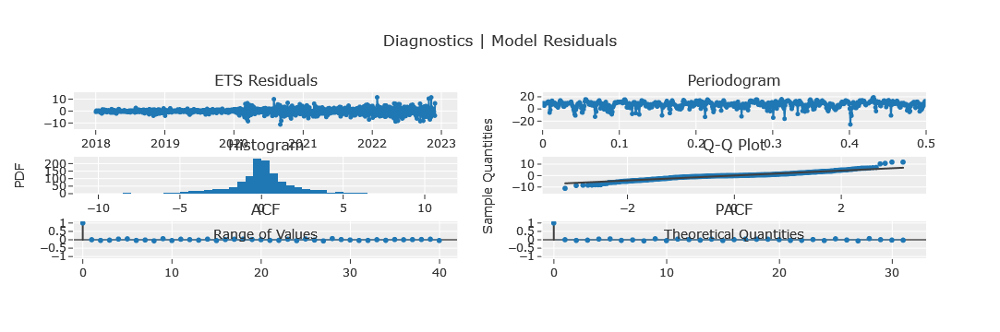

In [40]:
exp.plot_model(estimator=tuned_ets, plot="diagnostics")

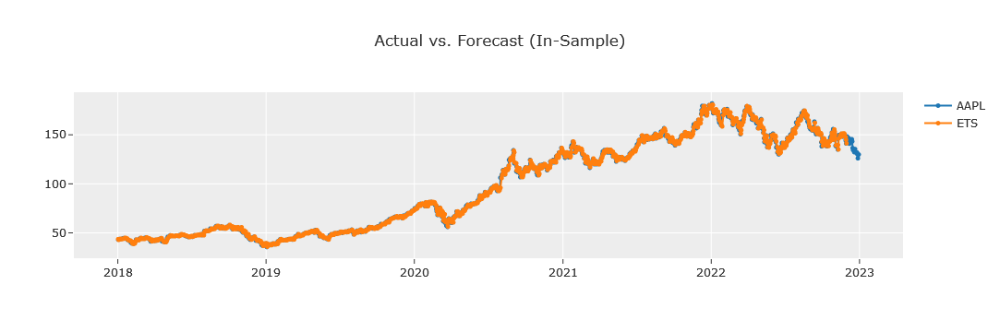

In [41]:
exp.plot_model(tuned_ets, plot='insample')

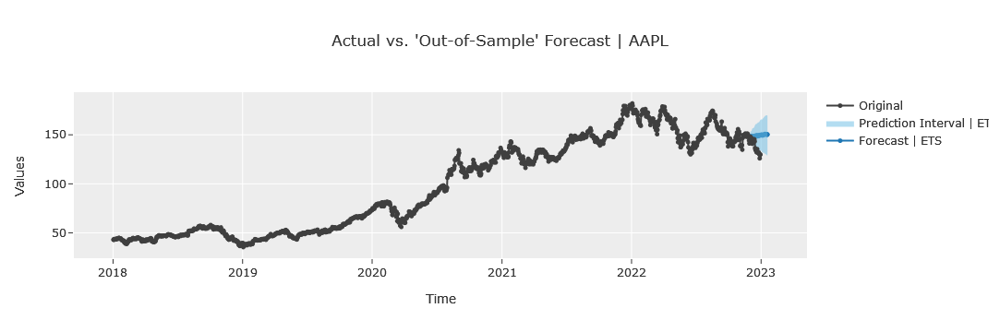

In [42]:
exp.plot_model(tuned_ets, plot='forecast', data_kwargs={'fh':36})

Predict Model

This function predicts Label using a trained model. When data is None, it predicts label on the holdout set.

In [43]:
holdout_pred = exp.predict_model(tuned_ets)

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,ETS,2.5442,2.2237,11.2771,13.3837,0.0847,0.0799,-2.9165


In [44]:
holdout_pred

,y_pred
2022-12-01,148.1093
2022-12-02,148.2199
2022-12-05,148.4520
2022-12-06,148.3290
2022-12-07,148.7901
2022-12-08,148.5977
2022-12-09,147.9245
2022-12-12,148.3591
2022-12-13,148.2512
2022-12-14,148.8011


Finalize Model

This function trains a given estimator on the entire dataset including the holdout set.

Model finalization is the last step in the experiment. This workflow will eventually lead you to the best model for use in making predictions on new and unseen data. The finalize_model() function fits the model onto the complete dataset including the test/hold-out sample. The purpose of this function is to train the model on the complete dataset before it is deployed in production.

In [45]:
final_model = exp.finalize_model(tuned_ets)

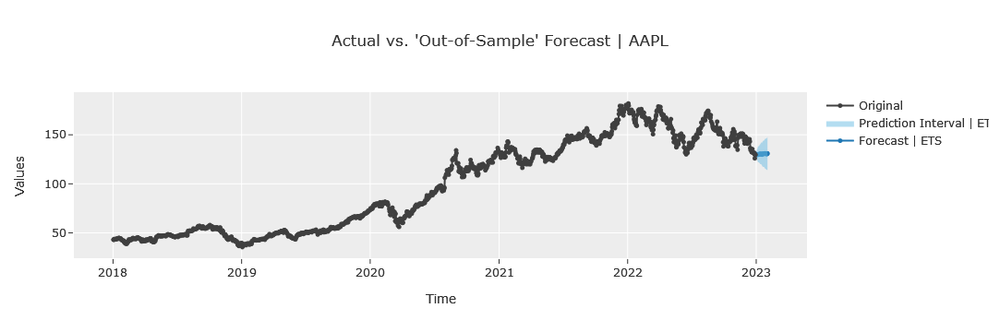

In [46]:
exp.plot_model(final_model, plot='forecast', data_kwargs={'fh':24})

In [47]:
unseen_predictions = exp.predict_model(final_model, fh=10)
unseen_predictions

,y_pred
2023-01-02,130.2601
2023-01-03,130.1456
2023-01-04,129.5306
2023-01-05,129.9239
2023-01-06,129.8417
2023-01-09,130.2706
2023-01-10,130.2455
2023-01-11,130.4426
2023-01-12,130.2774
2023-01-13,130.6500


Done!